# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [2]:
from utils import get_dataset, parse_frame

from matplotlib.patches import Rectangle
from waymo_open_dataset import dataset_pb2 as open_dataset
from waymo_open_dataset.utils import frame_utils

import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import tensorflow as tf

%matplotlib inline

In [3]:
dataset = get_dataset("/home/workspace/data/train/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [4]:
def display_images(batch):
    """
    Display images with bounding boxe. Classes are color-coded:
    - vehicles: red
    - pedastrians: blue
    - cyclists: green
    """
    
    #Define color coding for classes
    colormap = {1: [1,0,0], 2: [0,1,0], 4: [0,0,1]}
    
    # Create a figure with a 2x5 grid of subplots
    f, ax = plt.subplots(2,5, figsize=(80,40))

    for i in range(10):
        # Determine the position in the grid
        x = i % 2
        y = i % 5
        
        # Extract the image and ground truth data from the batch
        item = batch[i]
        image = item['image']
        boxes = item['groundtruth_boxes'].numpy()
        classes = item['groundtruth_classes'].numpy()
        
        #scale bounding boxes to the image size
        image_shape = image.shape
        image_width = image_shape[0]
        image_height = image_shape[1]
        scaled_boxes = boxes * np.array([image_width, image_height, image_width, image_height])

        # Display the image
        ax[x,y].imshow(image.numpy())
        
        # Draw each bounding box on the image
        for box, cls in zip(scaled_boxes, classes):
            y_min, x_min, y_max, x_max = box

            rec = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, facecolor='none', edgecolor=colormap[cls], linewidth = 2)
            ax[x, y].add_patch(rec)
        # Remove axis labels
        ax[x,y].axis('off')
    
    #Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

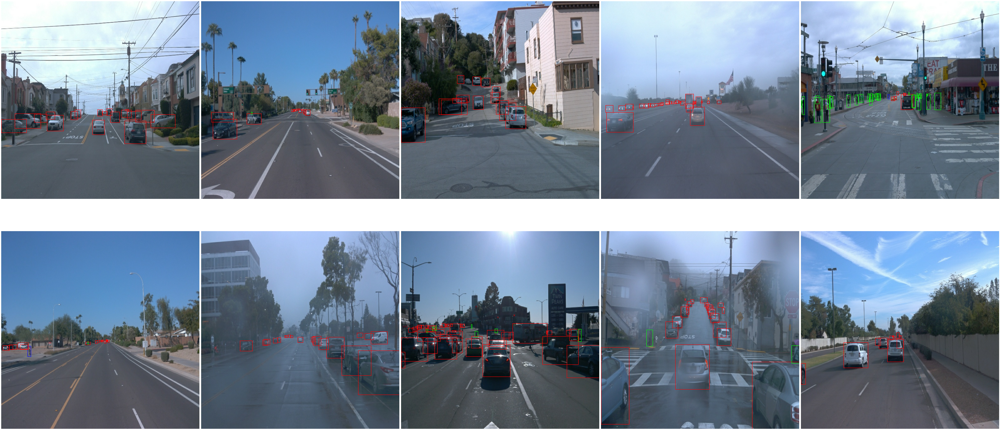

In [5]:
# Display 10 random images in dataset
# shuffel 
dataset.shuffle(86)
batch= []
for data in dataset.take(10):
    batch.append(data)
display_images(batch)
    

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [10]:
num_of_images = 0
num_of_padestrians = 0
num_of_cyclists = 0
num_of_cars = 0
car_id = 1
cyclist_id = 4
padestrian_id = 2

for data in dataset.take(86):
    num_of_images += 1
    
    #get class array
    classes = data['groundtruth_classes'].numpy()
    
    #check if at least one car is in that image
    if car_id in classes:
        num_of_cars += 1
        
    #check if at least one cyclist is in that image
    if cyclist_id in classes:
        num_of_cyclists += 1
        
    #check if at least one padestrian is in that image
    if padestrian_id in classes:
        num_of_padestrians += 1
    
print(f"Number of Images: {num_of_images}")
print(f"Number of Images with padestrians: {num_of_padestrians}")
print(f"Number of Images with cyclists: {num_of_cyclists}")
print(f"Number of Images with cars: {num_of_cars}")

Number of Images: 86
Number of Images with padestrians: 45
Number of Images with cyclists: 10
Number of Images with cars: 83
